# **ECE143 Hotel Booking**

# **Setup**

In [1]:
# Setup

# common:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
import folium

# for ML:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,  confusion_matrix, classification_report

In [2]:
from data_cleaning import *
from get_fig import *
from STL_analysis import *
from RFC import *

In [3]:
pd.options.mode.chained_assignment = None

# **Loading Data**

In [4]:
df = pd.read_csv('hotel_bookings.csv')
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


# **Data Cleaning**

In [5]:
df = clean_df(df)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,assigned_room_type,booking_changes,deposit_type,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,C,3,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,C,4,No Deposit,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,C,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,A,0,No Deposit,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,A,0,No Deposit,0,Transient,98.0,0,1,Check-Out,2015-07-03


# **Exploratory Data Analysis**

**Topics covered and questions to answer from the data:**
  
*   Where do the guests come from?
*   How much do guests pay for a room per night?
*   How does the price per night vary over the year
*   Which are the busiest month?
*   How long do people stay at the hotels?
*   Bookings by market segment  
*   How many bookings were canceled?   
*   Which month have the highest number of cancelations?
*   STL analysis

## **Hotel Type**

In [6]:
hotel_type_fig(df)

## **Guests Distribution**

In [7]:
country_counts = guest_distribution_pie(df)

In [8]:
guest_distribution_map(country_counts)

**Conclusion**:   
- Dominance of Local and European Guests: A significant majority of the hotel's guests are from Portugal, indicated by the largest segment of the pie chart. This is followed by guests from other European countries, such as Great Britain, France, Spain, and Germany, which also make up large portions of the guest demographics.

- International Diversity: The presence of numerous smaller segments from various countries suggests that the hotel attracts an international clientele. However, each of these segments contributes a relatively small percentage to the overall guest composition.

- Tourism and Marketing Insights: The high proportion of local Portuguese guests could indicate that the hotel is a popular choice for domestic travel. The strong showing from countries like Great Britain, France, Spain, and Germany suggests that these markets are significant sources of tourism, potentially due to geographic proximity, cultural ties, or targeted marketing efforts.

## **Hotel Price**

### **Room Price per night**

In [9]:
room_price_per_night(df)

**Price Distribution (ADR - Average Daily Rate):**

- The median ADR for each room type is indicated by the horizontal line in the middle of each box.
- Room types G and F for City Hotels have a higher median ADR compared to other room types.
- Room type H for Resort Hotels appears to have the highest median ADR among the Resort Hotel categories.
- Room type B for City Hotels shows a significantly lower median ADR, which is notable compared to other room types for City Hotels.
- Room types A, D, E, and F for City Hotels show a wider range of ADRs, which suggests more variability in the prices charged.
- Room types L and B for Resort Hotels indicate less variability in the ADR.

**Comparisons:**

- Resort Hotels typically have a narrower interquartile range compared to City Hotels, suggesting that their room pricing is more consistent.
- City Hotels generally exhibit a higher median ADR across most room types, with the exception of room type B.

### **Room Price per night per person**

In [10]:
data_resort, data_city, data = room_price_per_night_pp(df)

In [11]:
print('''Resort hotel: {:.2f} € per night and person.
City hotel: {:.2f} € per night and person.'''
      .format(data_resort['adr_pp'].mean(), data_city['adr_pp'].mean()))

Resort hotel: 47.49 € per night and person.
City hotel: 59.27 € per night and person.


**Price Distribution (ADR_PP - Average Daily Rate Per Person):**

- There is a noticeable variability in the ADR_pp across different room types for both City and Resort Hotels.
- Room Type A: Appears to have the widest range of prices for City Hotel, indicating a high variability in rates offered.
- Room Type L: Has the highest median price for Resort Hotels, suggesting special offerings such as suites or luxury accommodations, as indicated by their higher ADR_pp.
- Consistency: Resort Hotel appears to have more consistent pricing with fewer outliers.

**Comparison:**

- City Hotel: Typically charges more per room type, with greater price variability, potentially catering to a wider range of customers or offering more varied room qualities.
- Resort Hotel: Shows less variability and fewer extremes in pricing, which may appeal to guests looking for predictable pricing.

### **Price per night vary over the year**

In [12]:
price_over_year(data_resort, data_city)

**Conclusion:**

- Seasonal Trends: The chart shows clear seasonal trends in pricing for both types of hotels. Prices for resort hotels peak sharply in August, which is likely due to the summer vacation period when demand is high. City hotel prices also rise during the summer months but do not exhibit as sharp a peak, suggesting a more consistent demand throughout the year or possibly a different pricing strategy that doesn't capitalize on seasonal spikes as aggressively.

- Price Comparison: Throughout the year, city hotels maintain higher prices than resort hotels, except during the peak month of August when resort hotels surpass city hotel prices. This could reflect the premium value placed on city locations, except during the summer when scenic or resort locations are in higher demand.

- Off-Peak Pricing: Both types of hotels show a decrease in prices starting from September, with the lowest prices in November and December. This off-peak period may present an opportunity for promotions and special offers to attract guests when demand is typically lower.

## **Busiest Month**

In [13]:
busiest_month(data_resort, data_city)

**Conclusion**

- Peak Seasons: The chart indicates that both resort and city hotels experience peak seasons at different times of the year. The resort hotel shows a peak in the middle of the year, likely corresponding to the summer season when vacations are most popular. The city hotel, however, maintains a higher number of guests throughout the year with a less pronounced peak, suggesting a more consistent demand possibly due to business travel or city events.

- Off-Peak Trends: Post-summer months show a sharp decline for the resort hotel. For the city hotel, the decline towards the end of the year is more gradual, which might be due to various events or the appeal of city attractions during the holiday season.

- Demand Fluctuation: The fluctuation in demand is more pronounced for the resort hotel, which can be attributed to its seasonal nature. The city hotel's demand is relatively stable, suggesting a diverse client base and less sensitivity to seasonal changes.

## **Stays Distribution**

In [14]:
stay_distribution(data)

**Conclusion:**

- Shorter Stays at City Hotels: The chart shows that City Hotel has a higher frequency of shorter stays (around 1-3 days). This could indicate that City Hotel caters primarily to business travelers or short-term visitors who tend to stay for fewer nights.

- Longer Stays at Resort Hotels: Resort Hotel, on the other hand, shows a significant number of stays that are longer (around 4-10 days), which is typical for vacationers who tend to spend more time at the location.

- Very Long Stays Are Uncommon: Stays longer than 10 days are less common for both hotel types, with numbers drastically dropping. This is consistent with general travel behavior, as most vacations or business trips do not extend 

## **Bookings by market segment**

In [15]:
market_segment_pie(df)

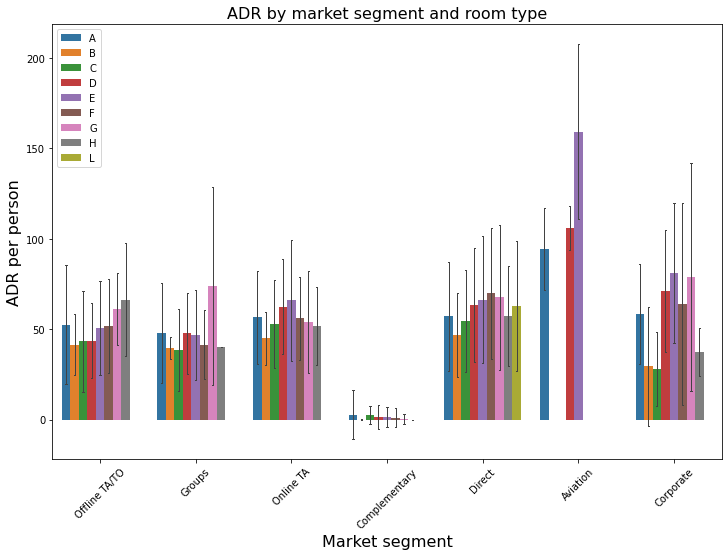

In [16]:
market_segment_barplot(df)

**Conclusion**

- Market Segment Variation: There is considerable variation in the ADR per person across different market segments. The 'Aviation' and 'Corporate' market segments have some of the highest ADRs, which could indicate a willingness to pay more among these travelers, possibly due to the costs being covered by businesses or the airlines themselves.

- Room Type Pricing: The ADR also varies significantly with room type within each market segment. This suggests that within each segment, there are different pricing strategies for different types of rooms, possibly reflecting the varying levels of service and amenities associated with each room category.

- Error Bars: The large error bars (indicating standard deviation) for some market segments and room types, especially 'Aviation' and 'Corporate', imply a high variability in prices. This could be due to a smaller sample size or a wide range of prices within these segments.

In [17]:
Airline_data, Non_Airline_data = airline_data(df)

In [18]:
Airline_data

,is_canceled,adults,lead_time,adr_pp
count,235.000000,235.000000,235.00000,235.000000
mean,0.221277,1.012766,4.47234,100.270979
std,0.415992,0.112503,4.61629,20.376689
min,0.000000,1.000000,0.00000,0.000000
25%,0.000000,1.000000,1.00000,95.000000
50%,0.000000,1.000000,3.00000,95.000000
75%,0.000000,1.000000,6.00000,110.000000
max,1.000000,2.000000,23.00000,193.500000


In [19]:
Non_Airline_data

,is_canceled,adults,lead_time,adr_pp
count,118968.000000,118968.00000,118968.000000,118968.000000
mean,0.371041,1.86087,104.311201,55.038354
std,0.483085,0.57450,106.889798,29.016829
min,0.000000,0.00000,0.000000,-3.190000
25%,0.000000,2.00000,18.000000,37.440000
50%,0.000000,2.00000,69.000000,49.500000
75%,1.000000,2.00000,161.000000,66.000000
max,1.000000,55.00000,737.000000,2700.000000


**Observations:**
- Cancellations: Non-airline bookings have a higher cancellation rate compared to airline bookings.
- Booking Lead Time: Non-airline bookings are made much further in advance than airline-associated bookings.
- Pricing: Airline bookings have a higher average daily rate per person compared to non-airline bookings, which may reflect a more premium service or clientele.

## **Cancellation Reasons Exploration**

### **Lead Time**

In [20]:
lead_time(df)

**Cancellation Insights:**

- Bookings with a shorter lead time (close to zero) have a lower likelihood of being canceled, as indicated by the red bars (canceled bookings) being shorter in that range.
- As lead time increases, the proportion of canceled bookings (red) also increases, suggesting a trend where bookings made well in advance are more likely to be canceled.

**Booking Behavior:**

- There are fewer bookings with long lead times, but these bookings show a higher relative proportion of cancellations.
- The highest count of non-canceled bookings is concentrated within a shorter lead time range, possibly suggesting that last-minute or short-term bookings are more committed and less likely to be canceled.

### **Deposite Type**

In [21]:
deposite_type(df)

**Conconlusion:**

- No Deposit: A significant majority of bookings without a deposit are not canceled, which suggests that guests might feel less committed and therefore less likely to cancel when they haven't put down a deposit.

- Non-Refundable Deposits: Bookings with non-refundable deposits have a higher cancellation rate compared to those with no deposit.

- Refundable Deposits: There are relatively few bookings with refundable deposits, but these show an interesting trend: despite the option to cancel and receive a refund, these bookings have a lower cancellation rate than those with non-refundable deposits, which might suggest that a refundable deposit leads guests more committed to their booking.

### **Previous Cancellations**

In [22]:
previous_cancel(df)

**Conclusion:**
- Low Previous Cancellations: The scatter plot reinforces that the vast majority of bookings are made by individuals with no or very few previous cancellations. This indicates that customers with a clean history in terms of cancellations are the most common.

- Decreasing Bookings with Increased Cancellations: There is a clear downward trend in the number of bookings as the number of previous cancellations increases. This could suggest that customers with a higher number of previous cancellations are either less likely to make new bookings or possibly could be restricted by the booking system due to their cancellation history.

- Cancellation Behavior: The data points for both canceled and not canceled current bookings are present across the range of previous cancellations, but there is no discernible pattern to suggest that a higher number of previous cancellations correlates directly with the likelihood of a current booking being canceled.

### **Which month have the highest number of cancelations?**

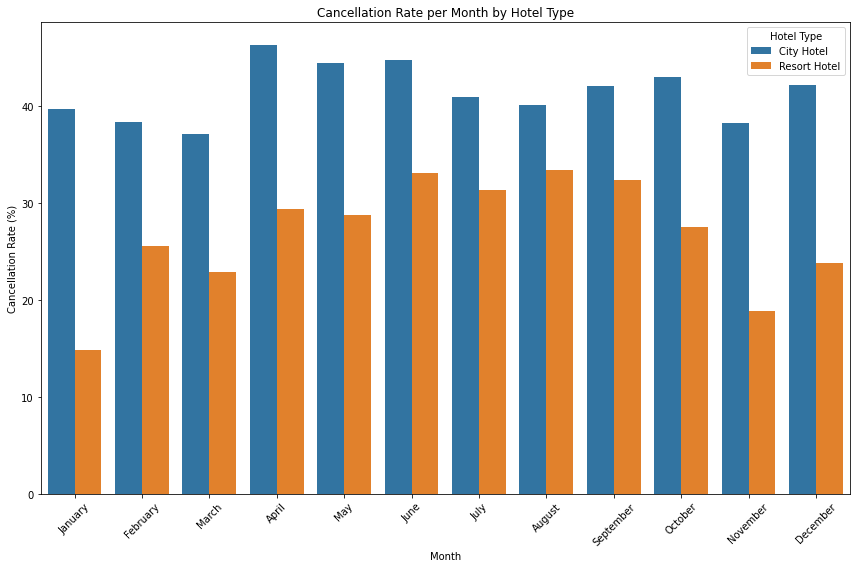

In [23]:
highest_num_cancel(df)

**Conclusion**
- Seasonal Variation: The bar chart shows a clear pattern of seasonal variation in cancellations for both hotel types. Cancellations for the City Hotel are highest in the middle of the year, around June and July, as well as in November. For the Resort Hotel, cancellations peak during the summer months, with the highest in August.

- City Hotel Cancellations: The City Hotel has a higher percentage of cancellations compared to the Resort Hotel for almost every month. This could be due to the nature of city hotel bookings, which might be more prone to business-related changes or short-term travel adjustments.

- Resort Hotel Cancellations: The Resort Hotel's cancellation rates are lower, but there is a noticeable peak during the summer. This peak may correspond to the high season for vacations when plans are more likely to change due to a variety of personal reasons.

## **STL Analysis**

In [24]:
# Load the dataset
file_path = 'hotel_bookings.csv'
df_stl = pd.read_csv(file_path)

# Display the first few rows of the dataframe
df_stl.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


Next, I'll aggregate the data to create a daily time series of bookings and then proceed with the STL decomposition and visualization of the components.

The STL decomposition of the hotel bookings dataset has been visualized below, showcasing the original series along with its trend, seasonal, and residual components:

Original Series: This plot displays the total number of daily bookings over time, providing a general overview of the booking volume and its fluctuations.

Trend Component: This graph illustrates the underlying trend in the data, smoothing out the seasonal variations and random noise to highlight long-term changes in booking volume. 

Seasonal Component: the seasonal pattern within the data, repeated over time, which could be related to factors such as holidays, weekends, or seasonal travel preferences. Through this graph, we see peaks in March, September, November and December, showing that there are more hotal demanding during these months, which could be out of the reason that there are holidays when people usually have travel plans.

Residual Component: This final plot shows the residuals, representing the noise or random fluctuations not explained by the trend or seasonal components. Residuals can help identify unusual data points or periods of high variability. The residual during 2015-12 is significantly high, which could be that there are special condition that people have higher travel demanding during the Christmas.

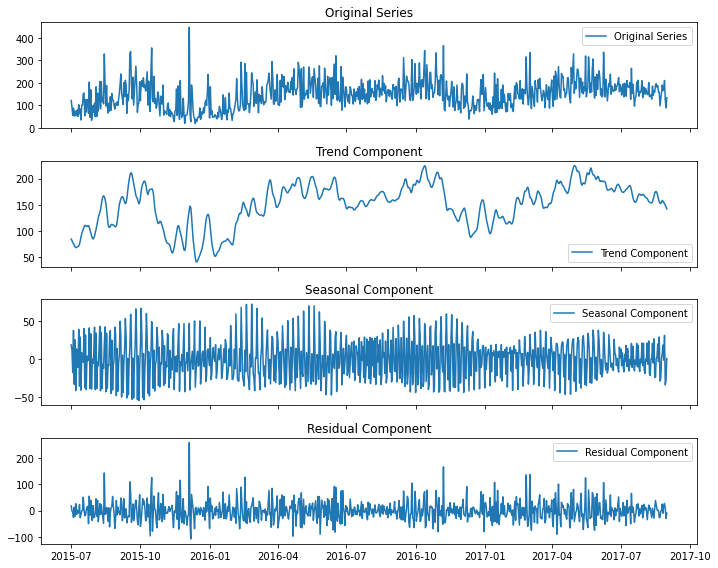

In [25]:
STL_analysis(df_stl)

# **Prediction Model**

## **Data Preprocessing**

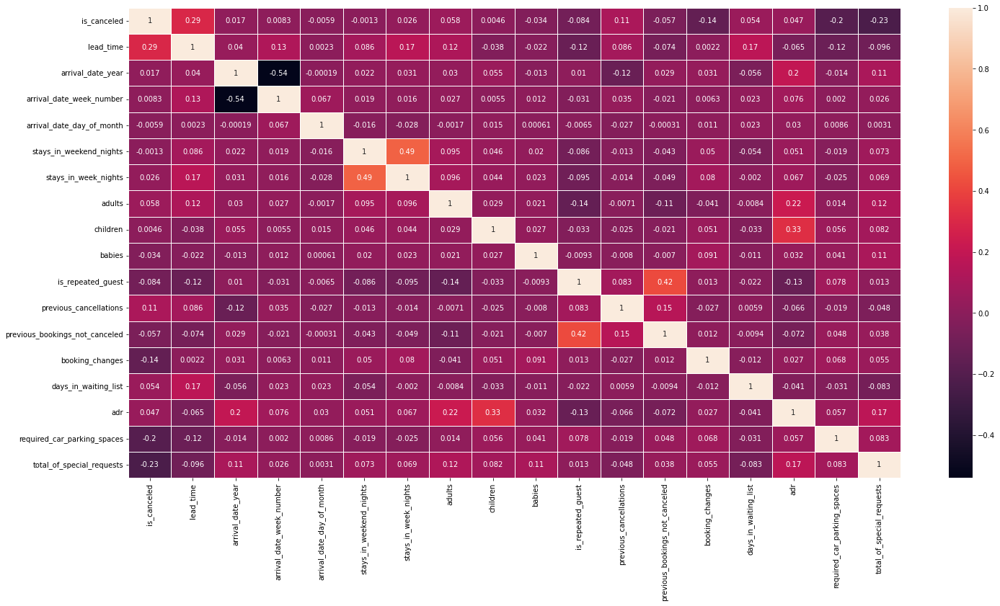

c:\Users\Lenovo\AppData\Local\Programs\Python\Python38\lib\site-packages\pandas\core\arraylike.py:364: RuntimeWarning:

invalid value encountered in log1p



In [26]:
X, y = preprocessing_df(df)

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

## **Random Forest Classifier**

In [28]:
acc_train, acc_test, conf, report = RFC_metrics(X_train, X_test, y_train, y_test)

In [29]:
print(f"Training Accuracy Score of Random Forest is : {acc_train}")
print(f"Testing Accuracy Score of Random Forest is : {acc_test}")
print(f"Confusion Matrix : \n{conf}")
print(f"Classification Report : \n{report}")

Training Accuracy Score of Random Forest is : 0.9999776291358136
Testing Accuracy Score of Random Forest is : 0.9546995067279621
Confusion Matrix : 
[[18428   141]
 [ 1209 10023]]
Classification Report : 
              precision    recall  f1-score   support

           0       0.94      0.99      0.96     18569
           1       0.99      0.89      0.94     11232

    accuracy                           0.95     29801
   macro avg       0.96      0.94      0.95     29801
weighted avg       0.96      0.95      0.95     29801



**Summary:**

- Model Accuracy: The Random Forest model achieved a perfect training accuracy of 1.0 and a very high testing accuracy of about 95%. There's no large gap between the training and testing accurancy, which implies the consistency.
- Precision and Recall: The model has a precision of 0.94 and a recall of 0.99 for non-cancellations, which is outstanding. For cancellations, the precision is even higher at 0.99, but the recall is slightly lower at 0.90, which is still quite high. The f1-scores are 0.97 for non-cancellations and 0.94 for cancellations, indicating a well-balanced model between precision and recall.